# Car Price Prediction with sklearn

## import Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pandas_profiling
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,  r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Load dataset

In [2]:
dataset = pd.read_csv('vehicles.csv')

In [3]:
# show the all columns for pandas
pd.set_option("display.max_columns", 100)
dataset.head()

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,image_url,description,county,state,lat,long
0,7184791621,https://duluth.craigslist.org/ctd/d/duluth-200...,duluth / superior,https://duluth.craigslist.org,6995,2000.0,gmc,new sierra 1500,excellent,8 cylinders,gas,167783.0,clean,automatic,1GTEK19T3YE366021,4wd,NaN,NaN,red,https://images.craigslist.org/00n0n_f06ykBMcdh...,2000 *** GMC New Sierra 1500 Ext Cab 157.5 WB...,NaN,mn,46.8433,-92.2550
1,7184773187,https://duluth.craigslist.org/cto/d/saginaw-20...,duluth / superior,https://duluth.craigslist.org,8750,2013.0,hyundai,sonata,excellent,4 cylinders,gas,90821.0,clean,automatic,NaN,fwd,NaN,NaN,grey,https://images.craigslist.org/00d0d_kgZ6xoeRw2...,For Sale: 2013 Hyundai Sonata GLS - $8750. O...,NaN,mn,46.9074,-92.4638
2,7193375964,https://newhaven.craigslist.org/cto/d/stratfor...,new haven,https://newhaven.craigslist.org,10900,2013.0,toyota,prius,good,4 cylinders,hybrid,92800.0,clean,automatic,NaN,fwd,NaN,NaN,blue,https://images.craigslist.org/00d0d_3sHGxPbY2O...,2013 Prius V Model Two. One owner—must sell my...,NaN,ct,41.1770,-73.1336
3,7195108810,https://albuquerque.craigslist.org/cto/d/albuq...,albuquerque,https://albuquerque.craigslist.org,12500,2003.0,mitsubishi,lancer,good,4 cylinders,gas,NaN,clean,manual,NaN,4wd,mid-size,sedan,grey,https://images.craigslist.org/00m0m_4a8Pb6JbMG...,"2003 Mitsubishi Lancer Evolution, silver. Abo...",NaN,nm,35.1868,-106.6650
4,7184712241,https://duluth.craigslist.org/ctd/d/rush-city-...,duluth / superior,https://duluth.craigslist.org,16995,2007.0,gmc,sierra classic 2500hd,good,8 cylinders,diesel,254217.0,clean,automatic,1GTHK23D57F102022,4wd,full-size,truck,white,https://images.craigslist.org/01414_g093aPtSMW...,"**Bad Credit, No Credit... No Problem!**2007 G...",NaN,mn,45.6836,-92.9648


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423857 entries, 0 to 423856
Data columns (total 25 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            423857 non-null  int64  
 1   url           423857 non-null  object 
 2   region        423857 non-null  object 
 3   region_url    423857 non-null  object 
 4   price         423857 non-null  int64  
 5   year          328743 non-null  float64
 6   manufacturer  313242 non-null  object 
 7   model         325384 non-null  object 
 8   condition     176719 non-null  object 
 9   cylinders     197679 non-null  object 
 10  fuel          327214 non-null  object 
 11  odometer      270585 non-null  float64
 12  title_status  327759 non-null  object 
 13  transmission  328065 non-null  object 
 14  vin           184420 non-null  object 
 15  drive         231119 non-null  object 
 16  size          102627 non-null  object 
 17  type          241157 non-null  object 
 18  pain

## Transformed dataset

In [5]:
# dropped unneccesary columns
drop_columns = ['id', 'url', 'region', 'region_url', 'title_status', 'vin', 'size', 'image_url', 'description','county', 'lat', 'long']
train = dataset.drop(columns=drop_columns)

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 423857 entries, 0 to 423856
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         423857 non-null  int64  
 1   year          328743 non-null  float64
 2   manufacturer  313242 non-null  object 
 3   model         325384 non-null  object 
 4   condition     176719 non-null  object 
 5   cylinders     197679 non-null  object 
 6   fuel          327214 non-null  object 
 7   odometer      270585 non-null  float64
 8   transmission  328065 non-null  object 
 9   drive         231119 non-null  object 
 10  type          241157 non-null  object 
 11  paint_color   222203 non-null  object 
 12  state         423857 non-null  object 
dtypes: float64(2), int64(1), object(10)
memory usage: 42.0+ MB


In [7]:
train.head()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,6995,2000.0,gmc,new sierra 1500,excellent,8 cylinders,gas,167783.0,automatic,4wd,NaN,red,mn
1,8750,2013.0,hyundai,sonata,excellent,4 cylinders,gas,90821.0,automatic,fwd,NaN,grey,mn
2,10900,2013.0,toyota,prius,good,4 cylinders,hybrid,92800.0,automatic,fwd,NaN,blue,ct
3,12500,2003.0,mitsubishi,lancer,good,4 cylinders,gas,NaN,manual,4wd,sedan,grey,nm
4,16995,2007.0,gmc,sierra classic 2500hd,good,8 cylinders,diesel,254217.0,automatic,4wd,truck,white,mn


In [8]:
# drop the NaN datas
train0 = train.dropna()

In [9]:
# reset index of train dataset
train0.reset_index(drop=True, inplace=True)

In [10]:
train0.head()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,16995,2007.0,gmc,sierra classic 2500hd,good,8 cylinders,diesel,254217.0,automatic,4wd,truck,white,mn
1,13995,2012.0,ford,f-150,good,6 cylinders,gas,188406.0,automatic,4wd,truck,grey,mn
2,7995,2010.0,chevrolet,equinox,good,4 cylinders,gas,108124.0,automatic,4wd,SUV,grey,mn
3,8995,2011.0,chevrolet,traverse,good,6 cylinders,gas,178054.0,automatic,4wd,SUV,white,mn
4,10995,2014.0,ford,explorer,good,6 cylinders,gas,170259.0,automatic,4wd,SUV,white,mn


In [11]:
train0.dtypes

price             int64
year            float64
manufacturer     object
model            object
condition        object
cylinders        object
fuel             object
odometer        float64
transmission     object
drive            object
type             object
paint_color      object
state            object
dtype: object

In [12]:
numetrics = ['int64', 'float64']
cat_columns = []
features = train0.columns.values.tolist()

In [13]:
# labelencodet for non numetrics datas
for col in features:
    if train0[col].dtype not in numetrics and col not in cat_columns:
        cat_columns.append(col)

# avoid the error
train0 = train0.copy()
le = LabelEncoder()

for col in cat_columns:
    label = list(train0[col].astype(str).values)
    le.fit(label)
    train0[col] = le.transform(label)

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

In [14]:
train0.head()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,16995,2007.0,14,8026,2,6,0,254217.0,0,0,10,10,23
1,13995,2012.0,13,3936,2,5,2,188406.0,0,0,10,5,23
2,7995,2010.0,7,3552,2,3,2,108124.0,0,0,0,5,23
3,8995,2011.0,7,9197,2,5,2,178054.0,0,0,0,10,23
4,10995,2014.0,13,3785,2,5,2,170259.0,0,0,0,10,23


In [15]:
train0.dtypes

price             int64
year            float64
manufacturer      int64
model             int64
condition         int64
cylinders         int64
fuel              int64
odometer        float64
transmission      int64
drive             int64
type              int64
paint_color       int64
state             int64
dtype: object

In [16]:
# change float to int
train0 = train0.copy()
train0['year'] = train0['year'].astype(int)
train0['odometer'] = train0['odometer'].astype(int)

In [17]:
train0.dtypes

price           int64
year            int64
manufacturer    int64
model           int64
condition       int64
cylinders       int64
fuel            int64
odometer        int64
transmission    int64
drive           int64
type            int64
paint_color     int64
state           int64
dtype: object

In [18]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85320 entries, 0 to 85319
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   price         85320 non-null  int64
 1   year          85320 non-null  int64
 2   manufacturer  85320 non-null  int64
 3   model         85320 non-null  int64
 4   condition     85320 non-null  int64
 5   cylinders     85320 non-null  int64
 6   fuel          85320 non-null  int64
 7   odometer      85320 non-null  int64
 8   transmission  85320 non-null  int64
 9   drive         85320 non-null  int64
 10  type          85320 non-null  int64
 11  paint_color   85320 non-null  int64
 12  state         85320 non-null  int64
dtypes: int64(13)
memory usage: 8.5 MB


## Exploratory Data Analysis

In [19]:
# count by value
train0['price'].value_counts()

0        3470
3500      991
6995      947
7995      923
4500      922
         ... 
40946       1
34801       1
36848       1
32750       1
22100       1
Name: price, Length: 4532, dtype: int64

In [20]:
# filtered data 
train0 = train0[train0['price'] > 1000]
train0 = train0[train0['price'] < 40000]
train0 = train0[train0['year'] > 2000]

In [21]:
train0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70995 entries, 0 to 85319
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   price         70995 non-null  int64
 1   year          70995 non-null  int64
 2   manufacturer  70995 non-null  int64
 3   model         70995 non-null  int64
 4   condition     70995 non-null  int64
 5   cylinders     70995 non-null  int64
 6   fuel          70995 non-null  int64
 7   odometer      70995 non-null  int64
 8   transmission  70995 non-null  int64
 9   drive         70995 non-null  int64
 10  type          70995 non-null  int64
 11  paint_color   70995 non-null  int64
 12  state         70995 non-null  int64
dtypes: int64(13)
memory usage: 7.6 MB


In [22]:
# show the correlation table
train0.corr()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
price,1.000000,0.611421,-0.068811,0.040290,0.022635,0.275101,-0.136194,-0.305941,0.169903,-0.110472,0.043985,0.059442,-0.028007
year,0.611421,1.000000,-0.015784,-0.000304,0.004272,-0.193145,0.099547,-0.350012,0.072555,-0.040618,0.026547,0.018513,-0.011301
manufacturer,-0.068811,-0.015784,1.000000,0.017706,-0.014763,-0.249909,-0.000688,0.016107,0.037851,-0.083308,0.019330,-0.023606,-0.005704
model,0.040290,-0.000304,0.017706,1.000000,-0.005414,0.110616,0.044874,0.015227,-0.016501,-0.122263,-0.127633,0.011004,0.005392
condition,0.022635,0.004272,-0.014763,-0.005414,1.000000,0.026598,0.024675,-0.006139,0.083573,0.047387,0.037990,0.013322,0.009823
cylinders,0.275101,-0.193145,-0.249909,0.110616,0.026598,1.000000,-0.144187,0.095818,0.002258,-0.038459,0.007357,0.060091,0.010692
fuel,-0.136194,0.099547,-0.000688,0.044874,0.024675,-0.144187,1.000000,-0.097829,0.063413,0.069338,-0.124493,-0.061756,-0.014696
odometer,-0.305941,-0.350012,0.016107,0.015227,-0.006139,0.095818,-0.097829,1.000000,-0.083184,-0.050881,0.001154,0.010009,0.017033
transmission,0.169903,0.072555,0.037851,-0.016501,0.083573,0.002258,0.063413,-0.083184,1.000000,0.058852,-0.007006,-0.011518,-0.009567
drive,-0.110472,-0.040618,-0.083308,-0.122263,0.047387,-0.038459,0.069338,-0.050881,0.058852,1.000000,0.187689,0.089948,-0.062547


In [23]:
train0.describe()

,price,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
count,70995.000000,70995.000000,70995.000000,70995.000000,70995.000000,70995.000000,70995.000000,7.099500e+04,70995.000000,70995.00000,70995.000000,70995.000000,70995.000000
mean,12367.476681,2010.758687,18.917529,5119.081414,1.101247,4.436228,1.934024,1.140379e+05,0.112543,0.77983,5.907303,5.653623,24.761730
std,8575.313181,4.695734,11.564097,2765.129139,1.159579,1.256989,0.492399,1.033293e+05,0.389830,0.72765,4.235857,3.991704,14.628578
min,1050.000000,2001.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000
25%,5990.000000,2007.000000,10.000000,2792.000000,0.000000,3.000000,2.000000,6.869000e+04,0.000000,0.00000,0.000000,1.000000,12.000000
50%,9950.000000,2011.000000,16.000000,5133.000000,1.000000,5.000000,2.000000,1.095670e+05,0.000000,1.00000,8.000000,8.000000,24.000000
75%,16578.000000,2014.000000,31.000000,7623.000000,2.000000,5.000000,2.000000,1.500000e+05,0.000000,1.00000,9.000000,9.000000,37.000000
max,39999.000000,2021.000000,41.000000,10038.000000,5.000000,7.000000,4.000000,9.400000e+06,2.000000,2.00000,12.000000,11.000000,50.000000


In [24]:
# Create the profile report for train0 dataset
profile=pandas_profiling.ProfileReport(train0)
profile.to_notebook_iframe()

In [25]:
# profile.to_file("profile_report.html")

In [26]:
# from IPython.display import IFrame
# IFrame(src='./profile_report.html', width=900, height=600)

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'year')

Text(0, 0.5, 'price')

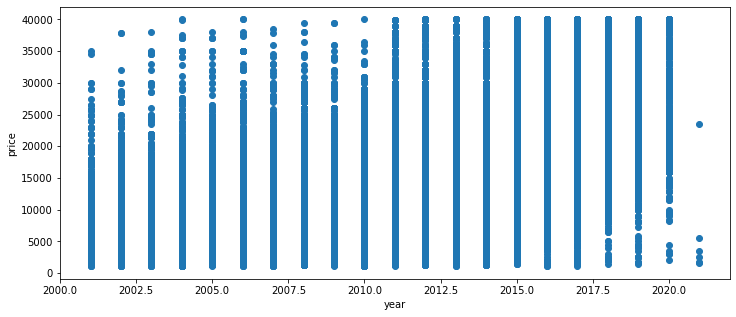

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'manufacturer')

Text(0, 0.5, 'price')

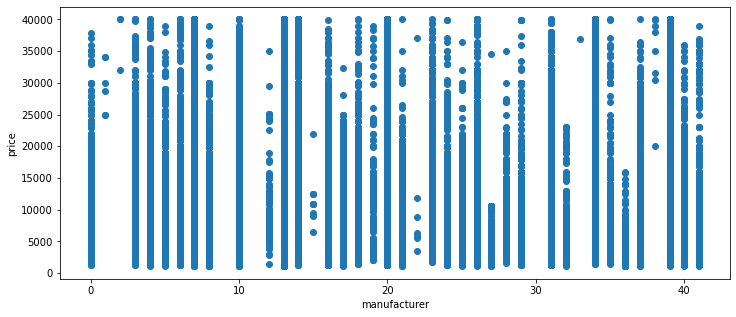

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'model')

Text(0, 0.5, 'price')

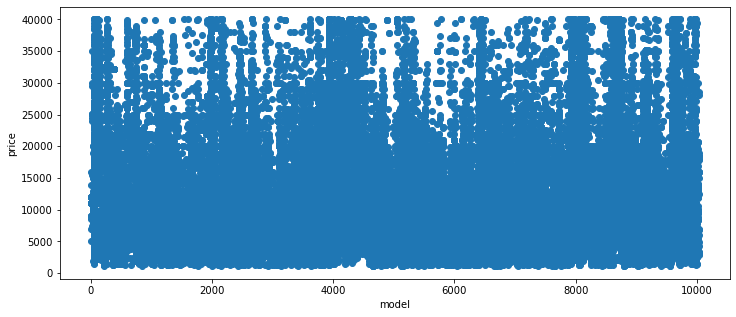

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'condition')

Text(0, 0.5, 'price')

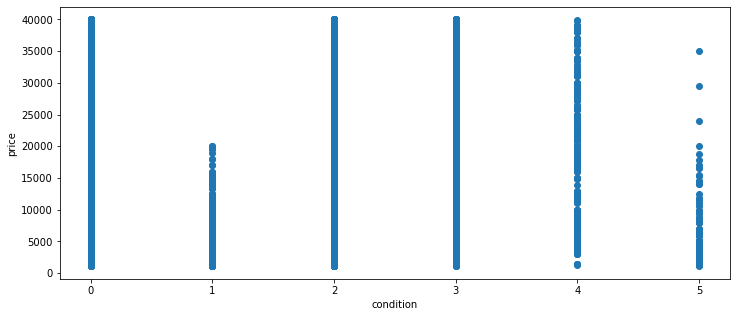

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'cylinders')

Text(0, 0.5, 'price')

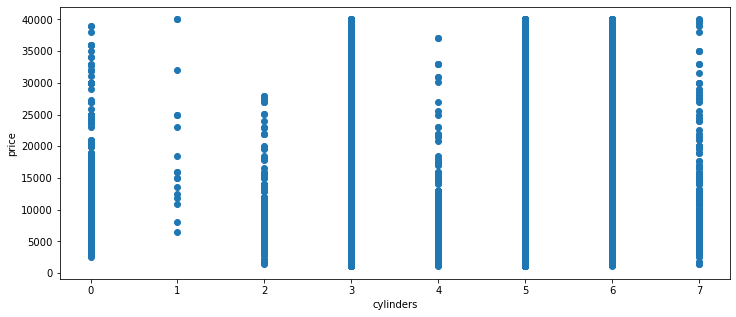

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'fuel')

Text(0, 0.5, 'price')

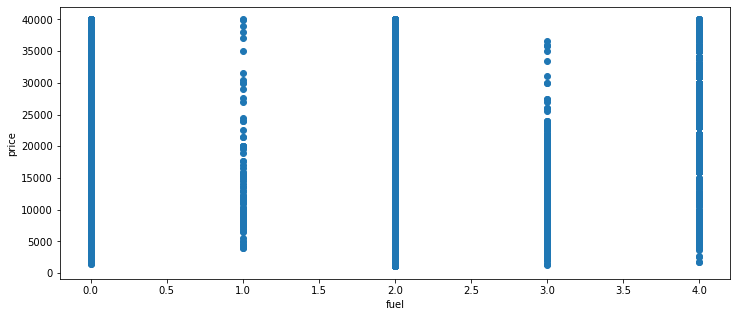

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'odometer')

Text(0, 0.5, 'price')

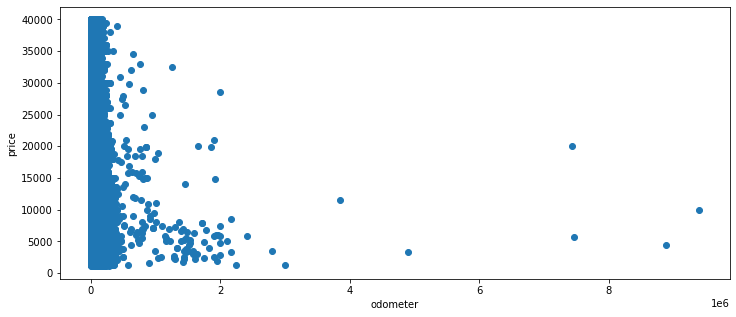

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'transmission')

Text(0, 0.5, 'price')

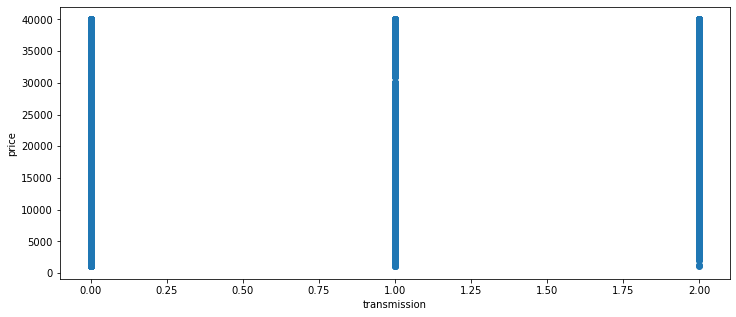

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'drive')

Text(0, 0.5, 'price')

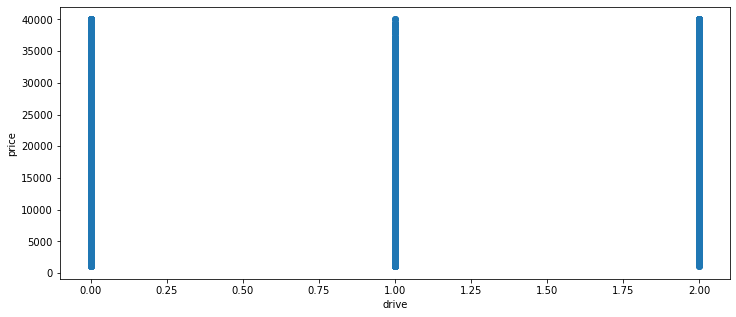

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'type')

Text(0, 0.5, 'price')

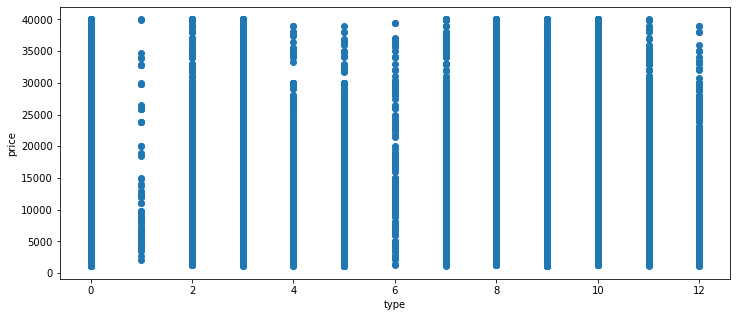

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'paint_color')

Text(0, 0.5, 'price')

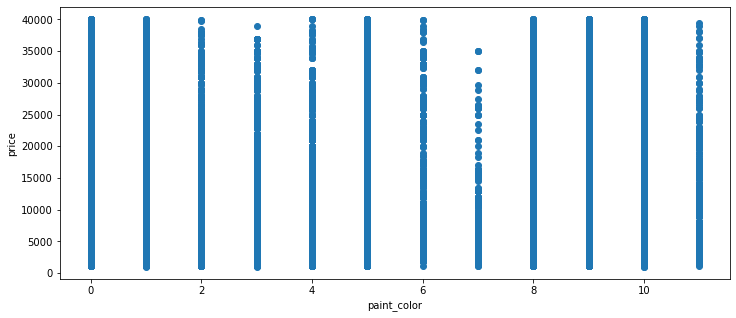

<Figure size 864x360 with 0 Axes>

Text(0.5, 0, 'state')

Text(0, 0.5, 'price')

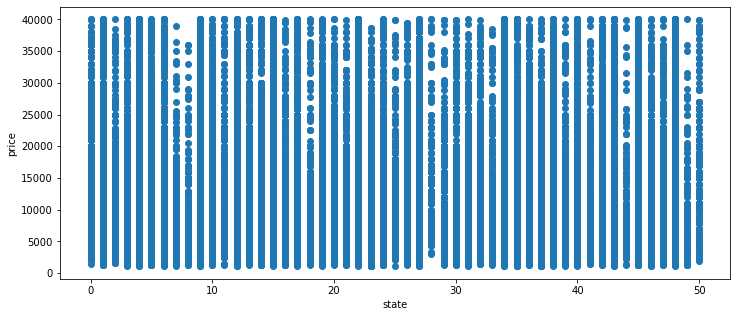

In [27]:
for col in train0.columns[1:]:
    plt.figure(figsize=(12, 5))
    plt.xlabel(col) 
    plt.ylabel('price')
    plt.scatter(train0[col], train0['price'])
    plt.show()

## Preparing to modeling

In [28]:
# Split data into target_name and others
train1 = train0.copy()

target_name = 'price'
train_target1 = train1[target_name]
train1.drop([target_name], axis=1, inplace=True)

In [29]:
train1

,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,2007,14,8026,2,6,0,254217,0,0,10,10,23
1,2012,13,3936,2,5,2,188406,0,0,10,5,23
2,2010,7,3552,2,3,2,108124,0,0,0,5,23
3,2011,7,9197,2,5,2,178054,0,0,0,10,23
4,2014,13,3785,2,5,2,170259,0,0,0,10,23
...,...,...,...,...,...,...,...,...,...,...,...,...
85314,2004,41,9796,0,4,2,292255,0,0,12,1,34
85315,2012,37,4733,0,3,2,82000,0,0,4,9,6
85317,2002,13,6439,2,5,2,58000,0,2,3,1,32
85318,2006,17,8316,1,5,2,159980,0,1,9,1,23


In [30]:
# Split the train and test data
train2, test2, train_target2, test_target2 = train_test_split(train1, train_target1, test_size=0.2, random_state=0)

In [31]:
# Normarized the train0 dataset
scaler = StandardScaler()
train3 = pd.DataFrame(scaler.fit_transform(train2), columns=train2.columns)

In [32]:
train3

,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
0,0.691642,0.875146,0.232199,-0.950927,-1.145074,0.135106,-0.562676,2.289199,-1.069806,0.729158,-1.168457,-1.081429
1,-0.583922,-0.510071,-0.491671,-0.950927,1.240329,0.135106,0.162680,-0.288158,1.674580,-1.392882,1.087132,-1.081429
2,1.329424,-0.769799,0.015255,0.774347,0.445194,0.135106,-0.326481,-0.288158,0.302387,-0.213971,-1.168457,-0.192376
3,0.266454,1.914058,0.922443,-0.950927,0.445194,0.135106,-0.029013,-0.288158,-1.069806,0.729158,-1.168457,-1.286596
4,-1.646893,0.095961,0.019594,0.774347,0.445194,0.135106,-0.054242,-0.288158,-1.069806,-1.392882,-0.917836,-0.329154
...,...,...,...,...,...,...,...,...,...,...,...,...
56791,1.116830,1.048298,0.976317,1.636985,-1.145074,0.135106,-0.569179,-0.288158,0.302387,0.729158,0.585890,0.491511
56792,1.116830,-0.163767,-1.429593,-0.950927,-1.145074,0.135106,-0.104375,-0.288158,0.302387,0.729158,1.087132,-1.423373
56793,1.542018,1.827482,-1.351854,-0.950927,0.445194,0.135106,-0.853663,-0.288158,-1.069806,-1.392882,1.087132,-1.081429
56794,0.691642,-1.029527,-0.455514,0.774347,1.240329,0.135106,0.456919,-0.288158,1.674580,1.200723,-1.419078,1.448953


In [33]:
# Split the data after the nomarized train0
train, test, target, target_test = train_test_split(train3, train_target2, test_size=0.3, random_state=0)

In [34]:
train

,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
46423,0.904236,-1.202679,0.226414,-0.950927,0.445194,0.135106,0.068660,-0.288158,0.302387,0.729158,0.836511,-0.192376
30096,-0.158734,1.740906,0.774921,-0.950927,0.445194,0.135106,0.197473,-0.288158,-1.069806,-1.392882,0.585890,-0.534320
22990,0.904236,1.048298,0.461798,0.774347,0.445194,0.135106,-0.223098,-0.288158,-1.069806,-1.392882,-0.165973,1.448953
560,-1.221705,-1.029527,0.218459,0.774347,0.445194,-3.900384,2.144720,-0.288158,1.674580,0.964941,1.087132,0.423122
35545,-0.583922,-1.289255,-1.648706,-0.950927,0.445194,0.135106,-0.408210,-0.288158,-1.069806,-0.685536,-0.165973,-1.286596
...,...,...,...,...,...,...,...,...,...,...,...,...
45891,-0.796516,1.048298,0.733702,0.774347,0.445194,0.135106,0.381502,-0.288158,0.302387,-0.213971,0.836511,-0.055599
52416,0.691642,0.095961,1.619557,0.774347,0.445194,0.135106,-0.375273,-0.288158,-1.069806,-1.392882,-1.419078,0.491511
42613,1.329424,-0.510071,-0.394408,-0.950927,1.240329,0.135106,-0.997235,-0.288158,-1.069806,0.964941,0.836511,0.081179
43567,1.754612,-1.029527,1.197600,1.636985,-1.145074,0.135106,-1.260915,-0.288158,0.302387,-0.449753,-1.419078,-0.534320


In [35]:
test

,year,manufacturer,model,condition,cylinders,fuel,odometer,transmission,drive,type,paint_color,state
24825,-0.371328,1.740906,1.570383,-0.950927,0.445194,0.135106,-0.220070,-0.288158,-1.069806,1.436505,1.087132,-0.807875
19153,-1.009110,-0.510071,-0.374160,0.774347,1.240329,0.135106,1.496736,-0.288158,-1.069806,0.964941,-1.168457,-1.081429
52185,-1.221705,-0.942951,0.700437,-0.950927,-1.145074,0.135106,-0.348190,2.289199,0.302387,-0.449753,1.087132,-0.397542
3100,1.116830,-1.029527,1.477097,-0.950927,0.445194,0.135106,0.453008,-0.288158,-1.069806,-1.392882,-0.165973,0.423122
26629,-0.583922,-0.250343,-1.427785,-0.950927,0.445194,0.135106,0.850763,-0.288158,0.302387,0.729158,-0.165973,-0.602708
...,...,...,...,...,...,...,...,...,...,...,...,...
13398,-1.221705,-0.510071,-0.178910,-0.950927,0.445194,0.135106,0.023969,-0.288158,-1.069806,0.729158,-1.419078,0.423122
47451,-1.859487,0.442265,0.295475,0.774347,0.445194,0.135106,0.113352,-0.288158,1.674580,-0.685536,-1.419078,1.175398
54547,-0.371328,-0.250343,-1.018484,-0.950927,-1.145074,0.135106,-0.078386,-0.288158,0.302387,0.729158,-1.419078,-0.671097
457,-0.158734,-0.077191,0.738041,-0.950927,1.240329,0.135106,0.172948,-0.288158,1.674580,-1.392882,1.087132,-1.081429


In [36]:
def acc_d(y_meas, y_pred):
    # Relative error between predicted y_pred and measured y_meas values
    # *len(y_meas)/sum(abs(y_meas)) means to divide by average measured
    return mean_absolute_error(y_meas, y_pred)*len(y_meas)/sum(abs(y_meas))

def acc_rmse(y_meas, y_pred):
    # RMSE between predicted y_pred and measured y_meas values
    return (mean_squared_error(y_meas, y_pred))**0.5

In [37]:
def acc_model(model,train,test):
    
    ytrain = model.predict(train)  
    ytest = model.predict(test)

    print('target = ', target[:5].values)
    print('ytrain = ', ytrain[:5])

    acc_train_r2_num = round(r2_score(target, ytrain) * 100, 2)
    print('acc(r2_score) for train =', acc_train_r2_num)   

    acc_train_d_num = round(acc_d(target, ytrain) * 100, 2)
    print('acc(relative error) for train =', acc_train_d_num)   

    acc_train_rmse_num = round(acc_rmse(target, ytrain) * 100, 2)
    print('acc(rmse) for train =', acc_train_rmse_num)   

    print('target_test =', target_test[:5].values)
    print('ytest =', ytest[:5])
    
    acc_test_r2_num = round(r2_score(target_test, ytest) * 100, 2)
    print('acc(r2_score) for test =', acc_test_r2_num)
    
    acc_test_d_num = round(acc_d(target_test, ytest) * 100, 2)
    print('acc(relative error) for test =', acc_test_d_num)
    
    acc_test_rmse_num = round(acc_rmse(target_test, ytest) * 100, 2)
    print('acc(rmse) for test =', acc_test_rmse_num)

## Modeling and Prediction

In [38]:
# Linear Regression
lr = LinearRegression()
lr.fit(train, target)

LinearRegression()

In [39]:
acc_model(lr,train,test)

target =  [ 8500 11990 14998 12000 10500]
ytrain =  [17988.25329294 13407.60535734 19019.77059153  8404.35559483
 11251.00197983]
acc(r2_score) for train = 60.11
acc(relative error) for train = 32.22
acc(rmse) for train = 541374.39
target_test = [11991 14995  1995 15499  5900]
ytest = [13499.21388416  9593.09035888  4138.67403888 18876.06458647
  9062.19781491]
acc(r2_score) for test = 59.71
acc(relative error) for test = 32.52
acc(rmse) for test = 545965.97


In [40]:
# Calculate the prediction by test
Y_test = lr.predict(test)

<Figure size 1296x720 with 0 Axes>

Text(0.5, 0, 'True values ')

Text(0, 0.5, 'Predictions ')

(0.0, 40000.0)

(0.0, 40000.0)

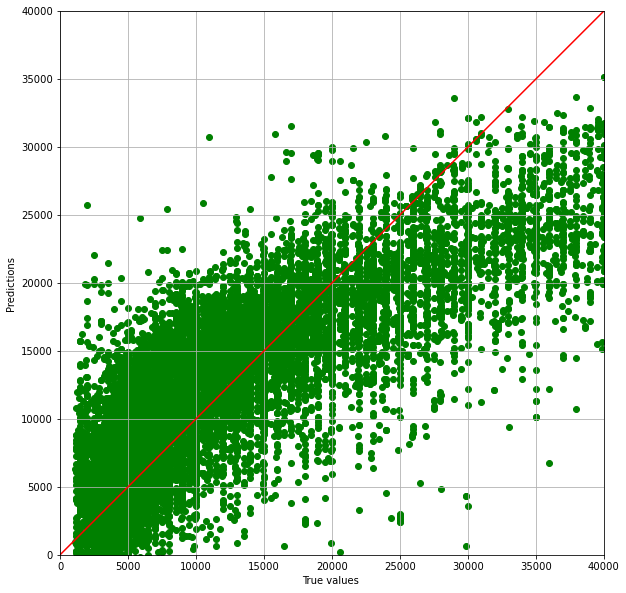

In [41]:
plt.figure(figsize=(18, 10))
plt.axes(aspect='equal')
plt.scatter(target_test, Y_test, color='green')
plt.xlabel('True values ')
plt.ylabel('Predictions ')
lims = [0, 40000]
plt.xlim(lims)
plt.ylim(lims)
plt.grid()
plt.plot(lims,lims, color='red')

In [42]:
# RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(train, target)

RandomForestRegressor()

In [43]:
acc_model(rf,train,test)

target =  [ 8500 11990 14998 12000 10500]
ytrain =  [ 9138.11       11572.42833333 16725.949      11092.8
  9735.49      ]
acc(r2_score) for train = 98.34
acc(relative error) for train = 5.4
acc(rmse) for train = 110288.5
target_test = [11991 14995  1995 15499  5900]
ytest = [12683.2  13705.75  2907.54 13124.88  5878.21]
acc(r2_score) for test = 89.23
acc(relative error) for test = 14.07
acc(rmse) for test = 282280.19


In [44]:
# Calculate the prediction by test
Y_test1 = rf.predict(test)

<Figure size 1296x720 with 0 Axes>

Text(0.5, 0, 'True values ')

Text(0, 0.5, 'Predictions ')

(0.0, 40000.0)

(0.0, 40000.0)

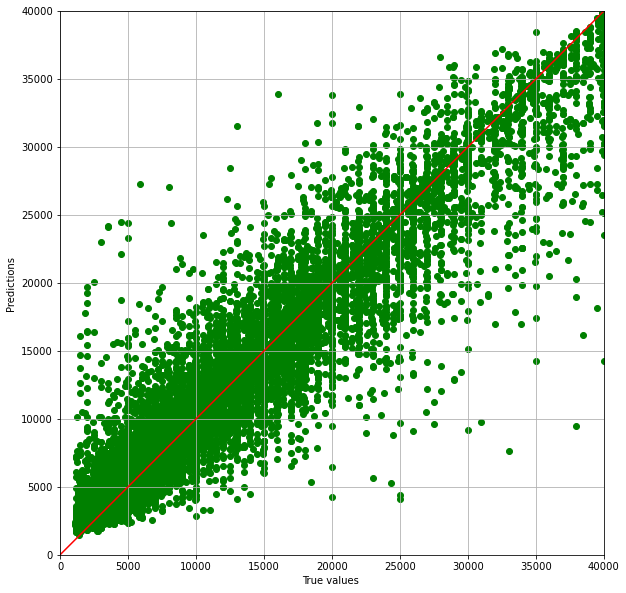

In [45]:
plt.figure(figsize=(18, 10))
plt.axes(aspect='equal')
plt.scatter(target_test, Y_test1, color='green')
plt.xlabel('True values ')
plt.ylabel('Predictions ')
lims = [0, 40000]
plt.xlim(lims)
plt.ylim(lims)
plt.grid()           
plt.plot(lims,lims, color="red")
plt.show()